In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('D:/archive (1)'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

D:/archive (1)\ICIAR2018_BACH_Challenge\ICIAR2018_BACH_Challenge\Photos\microscopy_ground_truth.csv
D:/archive (1)\ICIAR2018_BACH_Challenge\ICIAR2018_BACH_Challenge\Photos\Benign\b001.tif
D:/archive (1)\ICIAR2018_BACH_Challenge\ICIAR2018_BACH_Challenge\Photos\Benign\b002.tif
D:/archive (1)\ICIAR2018_BACH_Challenge\ICIAR2018_BACH_Challenge\Photos\Benign\b003.tif
D:/archive (1)\ICIAR2018_BACH_Challenge\ICIAR2018_BACH_Challenge\Photos\Benign\b004.tif
D:/archive (1)\ICIAR2018_BACH_Challenge\ICIAR2018_BACH_Challenge\Photos\Benign\b005.tif
D:/archive (1)\ICIAR2018_BACH_Challenge\ICIAR2018_BACH_Challenge\Photos\Benign\b006.tif
D:/archive (1)\ICIAR2018_BACH_Challenge\ICIAR2018_BACH_Challenge\Photos\Benign\b007.tif
D:/archive (1)\ICIAR2018_BACH_Challenge\ICIAR2018_BACH_Challenge\Photos\Benign\b008.tif
D:/archive (1)\ICIAR2018_BACH_Challenge\ICIAR2018_BACH_Challenge\Photos\Benign\b009.tif
D:/archive (1)\ICIAR2018_BACH_Challenge\ICIAR2018_BACH_Challenge\Photos\Benign\b010.tif
D:/archive (1)\ICIAR

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os
base_dir = 'D:/archive (1)'
print(os.listdir(base_dir))

# Matplotlib for visualization
import matplotlib.pyplot as plt
plt.style.use("ggplot")

# OpenCV Image Library
import cv2

# Import PyTorch
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, Dataset
import torchvision
import torch.optim as optim

# Import useful sklearn functions
import sklearn
from sklearn.metrics import roc_auc_score, accuracy_score
from PIL import Image

['ICIAR2018_BACH_Challenge', 'ICIAR2018_BACH_Challenge_TestDataset']


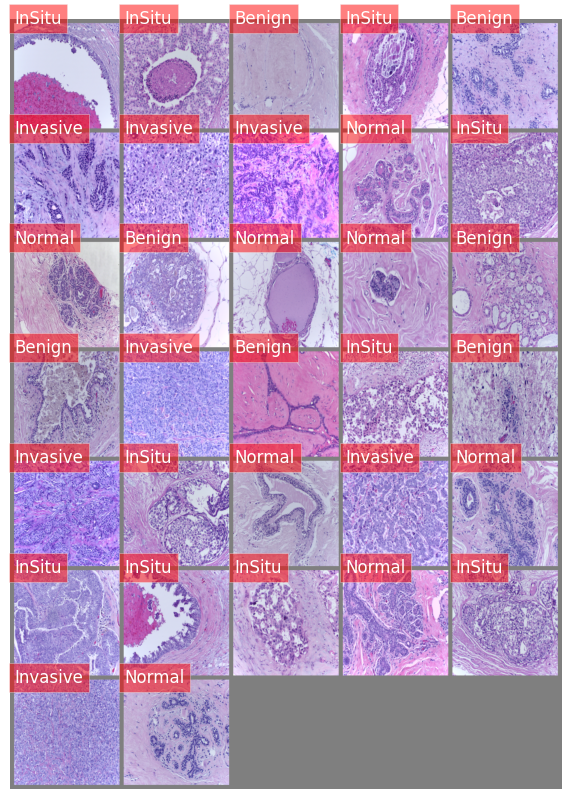

In [3]:
import numpy as np
import pandas as pd
import os
from PIL import Image, UnidentifiedImageError
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import torchvision.utils as vutils

# Custom Dataset Class with Preprocessing and Filtering
class BACHDataset(Dataset):
    def __init__(self, root_dirs, transform=None):
        self.root_dirs = root_dirs
        self.transform = transform
        self.classes = ['Normal', 'Benign', 'InSitu', 'Invasive']
        self.images = []
        self.labels = []
        
        for idx, class_name in enumerate(self.classes):
            class_dir = os.path.join(root_dirs['photos'], class_name)
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                if self._is_image_file(img_path):
                    self.images.append(img_path)
                    self.labels.append(idx)
                
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        img_path = self.images[idx]
        try:
            image = Image.open(img_path).convert('RGB')
        except UnidentifiedImageError:
            return self.__getitem__((idx + 1) % len(self))
        
        label = self.labels[idx]
        
        if self.transform:
            image = self.transform(image)
        
        return {'image': image, 'label': label}
    
    def _is_image_file(self, filename):
        try:
            Image.open(filename).verify()
            return True
        except (IOError, UnidentifiedImageError):
            return False

# Define transformations for training and validation
train_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(0),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

val_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Directories
root_dirs = {
    'photos': 'D:/archive (1)/ICIAR2018_BACH_Challenge/ICIAR2018_BACH_Challenge/Photos',
    'wsi_gt': 'D:/archive (1)/ICIAR2018_BACH_Challenge/ICIAR2018_BACH_Challenge/WSI/gt_thumbnails',
    'wsi_thumbnails': 'D:/archive (1)/ICIAR2018_BACH_Challenge/ICIAR2018_BACH_Challenge/WSI/thumbnails',
    'test_photos': 'D:/archive (1)/ICIAR2018_BACH_Challenge_TestDataset/ICIAR2018_BACH_Challenge_TestDataset/Photos',
    'test_wsi_thumbnails': 'D:/archive (1)/ICIAR2018_BACH_Challenge_TestDataset/ICIAR2018_BACH_Challenge_TestDataset/WSI/thumbnails'
}

# Create dataset and dataloaders
train_dataset = BACHDataset(root_dirs=root_dirs, transform=train_transform)
val_dataset = BACHDataset(root_dirs=root_dirs, transform=val_transform)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Function to unnormalize and display images
def imshow(img, labels, title=None, rows=5):
    img = img / 2 + 0.5  # unnormalize
    npimg = img.numpy()
    
    fig, ax = plt.subplots(figsize=(20, 10))  # Increase figsize for larger images
    ax.imshow(np.transpose(npimg, (1, 2, 0)))
    
    if title is not None:
        plt.title(title)
    
    if labels is not None:
        for i, label in enumerate(labels):
            row = i // rows
            col = i % rows
            ax.text(col * (img.shape[2] // rows) + 10, row * (img.shape[1] // (len(labels) // rows + 1)) + 10, 
                    label, fontsize=12, color='white', bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.show()

# Get a batch of training data
dataiter = iter(train_loader)
batch = next(dataiter)
images, labels = batch['image'], batch['label']

# Make a grid from batch with 5 images per row and add padding
out = vutils.make_grid(images, nrow=5, padding=10)

# Display the images
imshow(out, title=None, labels=[train_dataset.classes[x] for x in labels])


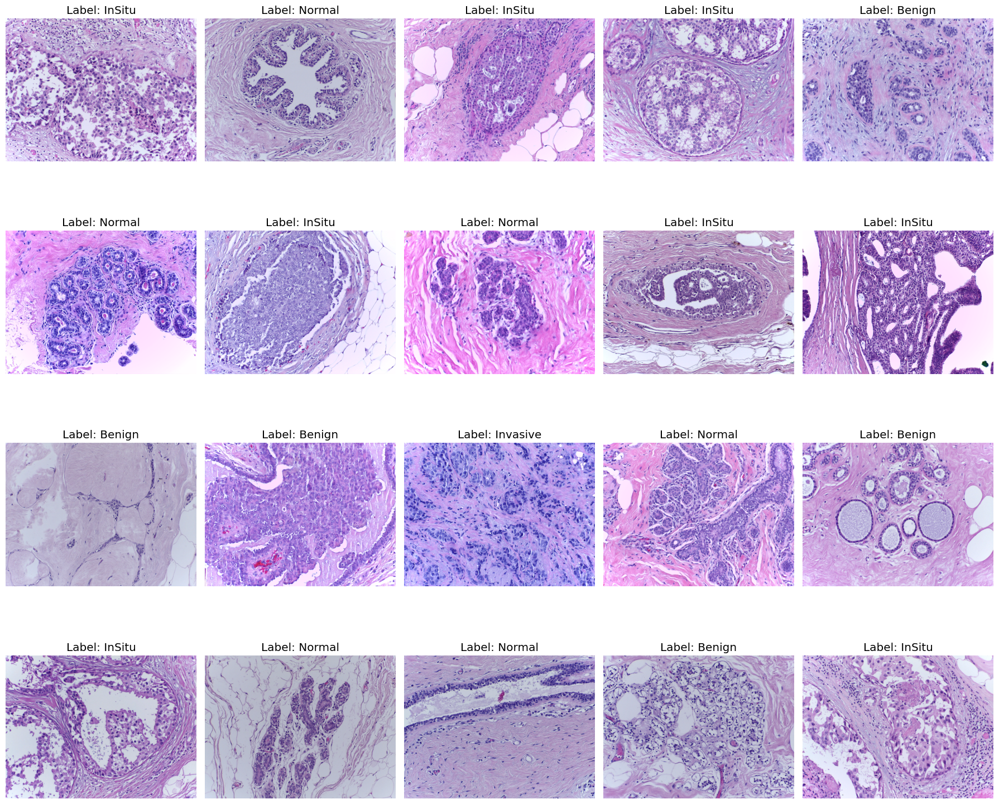

In [4]:
import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

# Function to display randomly selected original images from file paths
def show_random_original_images(dataset, num_images=20, ncols=5):
    # Randomly select images
    random_indices = np.random.choice(len(dataset), num_images, replace=False)
    random_images = [dataset.images[i] for i in random_indices]
    random_labels = [dataset.labels[i] for i in random_indices]
    
    # Calculate number of rows for the grid
    nrows = (num_images + ncols - 1) // ncols
    
    # Create subplots
    fig, axes = plt.subplots(nrows, ncols, figsize=(18, 4 * nrows))
    
    # Iterate over selected images and display them
    for i, (img_path, label) in enumerate(zip(random_images, random_labels)):
        ax = axes.flatten()[i]
        image = Image.open(img_path)
        ax.imshow(image)
        ax.set_title('Label: %s' % dataset.classes[label])
        ax.axis('off')
    
    # Remove empty subplots
    for i in range(num_images, nrows * ncols):
        axes.flatten()[i].remove()
    
    plt.tight_layout()
    plt.show()

# Use the BACHDataset class you defined
class BACHDataset(Dataset):
    def __init__(self, root_dirs, transform=None):
        self.root_dirs = root_dirs
        self.classes = ['Normal', 'Benign', 'InSitu', 'Invasive']
        self.images = []
        self.labels = []
        self.transform = transform

        for idx, class_name in enumerate(self.classes):
            class_dir = os.path.join(root_dirs['photos'], class_name)
            for img_name in os.listdir(class_dir):
                img_path = os.path.join(class_dir, img_name)
                self.images.append(img_path)
                self.labels.append(idx)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path)
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return {'image': image, 'label': label}

# Directories
root_dirs = {
    'photos': 'D:/archive (1)/ICIAR2018_BACH_Challenge/ICIAR2018_BACH_Challenge/Photos',
    'wsi_gt': 'D:/archive (1)/ICIAR2018_BACH_Challenge/ICIAR2018_BACH_Challenge/WSI/gt_thumbnails',
    'wsi_thumbnails': 'D:/archive (1)/ICIAR2018_BACH_Challenge/ICIAR2018_BACH_Challenge/WSI/thumbnails',
    'test_photos': 'D:/archive (1)/ICIAR2018_BACH_Challenge_TestDataset/ICIAR2018_BACH_Challenge_TestDataset/Photos',
    'test_wsi_thumbnails': 'D:/archive (1)/ICIAR2018_BACH_Challenge_TestDataset/ICIAR2018_BACH_Challenge_TestDataset/WSI/thumbnails'
}
# Example usage
transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(30),
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.2),
    transforms.RandomGrayscale(p=0.2),
    transforms.GaussianBlur(3),
    transforms.ToTensor(),  # Ensure the image is converted to a tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create dataset
dataset = BACHDataset(root_dirs=root_dirs, transform=transform)

# Display randomly selected original images
show_random_original_images(dataset, num_images=20, ncols=5)


In [5]:
import torch
import torchvision.models as models
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
import numpy as np
from torchvision import transforms
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, confusion_matrix, roc_auc_score, accuracy_score
from torch.optim.lr_scheduler import ReduceLROnPlateau
from PIL import ImageEnhance
from PIL import Image, ImageEnhance
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms
from sklearn.model_selection import train_test_split
import cv2
import random

class SpecificColorPopup:
    def __init__(self, probability=1.5, factor=2.5):
        self.probability = probability
        self.factor = factor

    def __call__(self, img):
        if random.random() < self.probability:
            img = self.enhance_specific_colors(img, self.factor)
        return img

    def enhance_specific_colors(self, img, factor):
        img_cv = np.array(img)
        img_cv = cv2.cvtColor(img_cv, cv2.COLOR_RGB2HSV)

        color_ranges = [
            ((140, 50, 50), (170, 255, 255)),  # Pink
            ((120, 50, 50), (140, 255, 255)),  # Purple
            ((100, 50, 50), (120, 255, 255)),  # Blue
            ((0, 50, 50), (10, 255, 255)),     # Red
            ((170, 50, 50), (180, 255, 255)),  # Red again
            ((80, 50, 50), (100, 255, 255))    # Greenish-blue
        ]

        for lower, upper in color_ranges:
            mask = cv2.inRange(img_cv, lower, upper)
            img_cv[mask > 0] = self.enhance_color(img_cv[mask > 0], factor)

        img_cv = cv2.cvtColor(img_cv, cv2.COLOR_HSV2RGB)
        return Image.fromarray(img_cv)

    def enhance_color(self, pixels, factor):
        pixels[:, 1] = np.clip(pixels[:, 1] * factor, 0, 255)
        return pixels

class EdgeSharpening:
    def __init__(self, factor=8.0):
        self.factor = factor

    def __call__(self, img):
        enhancer = ImageEnhance.Sharpness(img)
        img = enhancer.enhance(self.factor)
        return img
# Assuming 'YourDataset' is your dataset class
transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(30),
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.2),  # Enhanced Data Augmentation
    transforms.RandomGrayscale(p=0.2),  # Enhanced Data Augmentation
    transforms.GaussianBlur(3),  # Enhanced Data Augmentation
    SpecificColorPopup(probability=1.5, factor=2.5),  # Add custom color popup transformation
    EdgeSharpening(factor=8.0),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create dataset and dataloaders
class BalancedSubsetSampler(torch.utils.data.Sampler):
    def __init__(self, labels, num_per_class):
        self.labels = labels
        self.num_per_class = num_per_class

    def __iter__(self):
        indices = []
        for label in set(self.labels):
            label_indices = [i for i, l in enumerate(self.labels) if l == label]
            indices.extend(random.sample(label_indices, self.num_per_class))
        random.shuffle(indices)
        return iter(indices)

    def __len__(self):
        return len(set(self.labels)) * self.num_per_class

# Define the number of images per class you want in the validation set
num_images_per_class_val = 25

# Create the full dataset
dataset = BACHDataset(root_dirs=root_dirs, transform=train_transform)
labels = [dataset[i]['label'] for i in range(len(dataset))]

# Separate indices for each class
class_indices = {}
for idx, label in enumerate(labels):
    if label not in class_indices:
        class_indices[label] = []
    class_indices[label].append(idx)

# Initialize lists to hold indices for training and validation
train_indices = []
val_indices = []

# Allocate images for each class to training and validation
for class_label, indices in class_indices.items():
    # Shuffle indices for each class
    random.shuffle(indices)
    # Split indices for each class into training and validation
    val_indices.extend(indices[:num_images_per_class_val])
    train_indices.extend(indices[num_images_per_class_val:])

# Create the validation dataset
val_dataset = Subset(dataset, val_indices)

# Create the training dataset
train_dataset = Subset(dataset, train_indices)

# Create the validation dataset using the balanced subset sampler
val_sampler = BalancedSubsetSampler(labels, num_images_per_class_val)
val_loader = DataLoader(dataset, batch_size=32, sampler=val_sampler)

# Create the training data loader
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# Squeeze-and-Excitation Block
class SEBlock(nn.Module):
    def __init__(self, channel, reduction=16):
        super(SEBlock, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channel, channel // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channel // reduction, channel, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

# Self-Attention Block
class SelfAttention(nn.Module):
    def __init__(self, in_dim):
        super(SelfAttention, self).__init__()
        self.chanel_in = in_dim

        self.query_conv = nn.Conv2d(in_channels=in_dim, out_channels=in_dim // 8, kernel_size=1)
        self.key_conv = nn.Conv2d(in_channels=in_dim, out_channels=in_dim // 8, kernel_size=1)
        self.value_conv = nn.Conv2d(in_channels=in_dim, out_channels=in_dim, kernel_size=1)
        self.gamma = nn.Parameter(torch.zeros(1))

        self.softmax = nn.Softmax(dim=-1)

    def forward(self, x):
        m_batchsize, C, width, height = x.size()
        proj_query = self.query_conv(x).view(m_batchsize, -1, width * height).permute(0, 2, 1)
        proj_key = self.key_conv(x).view(m_batchsize, -1, width * height)
        energy = torch.bmm(proj_query, proj_key)
        attention = self.softmax(energy)
        proj_value = self.value_conv(x).view(m_batchsize, -1, width * height)

        out = torch.bmm(proj_value, attention.permute(0, 2, 1))
        out = out.view(m_batchsize, C, width, height)

        out = self.gamma * out + x
        return out

# Custom ResNet with SE and Self-Attention Blocks
class SEResNet50WithAttention(nn.Module):
    def __init__(self, num_classes):
        super(SEResNet50WithAttention, self).__init__()
        self.model = models.resnet50(pretrained=True)
        self.model.layer1 = self._add_se_and_attention_block(self.model.layer1)
        self.model.layer2 = self._add_se_and_attention_block(self.model.layer2)
        self.model.layer3 = self._add_se_and_attention_block(self.model.layer3)
        self.model.layer4 = self._add_se_and_attention_block(self.model.layer4)
        self.model.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(self.model.fc.in_features, num_classes)
        )

    def _add_se_and_attention_block(self, layer):
        for name, module in layer.named_children():
            if isinstance(module, nn.Sequential):
                layer[int(name)] = nn.Sequential(
                    module,
                    SEBlock(module[-1].conv3.out_channels),
                    SelfAttention(module[-1].conv3.out_channels)  # Adding Self-Attention Block
                )
        return layer

    def forward(self, x):
        return self.model(x)

# Instantiate the model
num_classes = len(dataset.classes)
model = SEResNet50WithAttention(num_classes=num_classes)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

C:\Users\mahed\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\mahed\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [6]:
import math

# Assuming you have already defined your train_dataset and val_dataset
# Get the number of samples in the training and validation datasets
num_train_samples = len(train_dataset)
num_val_samples = len(val_dataset)

# Define your batch size
batch_size = 32

# Calculate the number of batches
num_train_batches = math.ceil(num_train_samples / batch_size)
num_val_batches = math.ceil(num_val_samples / batch_size)

print(f'Number of training samples: {num_train_samples}')
print(f'Number of validation samples: {num_val_samples}')
print(f'Number of training batches: {num_train_batches}')
print(f'Number of validation batches: {num_val_batches}')


Number of training samples: 300
Number of validation samples: 100
Number of training batches: 10
Number of validation batches: 4


In [7]:
# Set device
print(model)

SEResNet50WithAttention(
  (model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequenti

In [8]:
# Optimizer and loss function
optimizer = optim.AdamW(model.parameters(), lr=1e-4)
criterion = nn.CrossEntropyLoss()

# Create ReduceLROnPlateau scheduler
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.1, verbose=True)

In [9]:
import torch

# Check if CUDA is available
train_on_gpu = torch.cuda.is_available()

# Print the result
if train_on_gpu:
    print('CUDA is available! Training on GPU...')
else:
    print('CUDA is not available. Training on CPU...')

CUDA is available! Training on GPU...


In [10]:
# Inside your model creation code, after defining your model
if train_on_gpu:
    model.cuda()

In [11]:
import torch
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, confusion_matrix
import random
from sklearn.preprocessing import OneHotEncoder

# Initialize OneHotEncoder
onehot_encoder = OneHotEncoder(sparse_output=False)

# Training loop with evaluation metrics
n_epochs = 100
valid_loss_min = np.Inf

# Keeping track of losses and accuracies
train_losses = []
valid_losses = []
train_accuracies = []
valid_accuracies = []
auc_epoch = []

for epoch in range(1, n_epochs + 1):
    # Keep track of training and validation loss and accuracy
    train_loss = 0.0
    valid_loss = 0.0
    train_correct = 0
    train_total = 0
    val_correct = 0
    val_total = 0
    val_auc_epoch = []
    val_precision_epoch = []
    val_recall_epoch = []
    val_specificity_epoch = []
    
    ###################
    # train the model #
    ###################
    model.train()
    for data in train_loader:
        images, target = data['image'], data['label']
        # Move tensors to GPU if CUDA is available
        if train_on_gpu:
            images, target = images.cuda(), target.cuda()
        # Clear the gradients of all optimized variables
        optimizer.zero_grad()
        # Forward pass: compute predicted outputs by passing inputs to the model
        output = model(images)
        # Calculate the batch loss
        loss = criterion(output, target)
        # Backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # Perform a single optimization step (parameter update)
        optimizer.step()
        # Update Train loss
        train_loss += loss.item() * images.size(0)
        
        # Calculate accuracy
        _, preds = torch.max(output, 1)
        train_correct += (preds == target).sum().item()
        train_total += target.size(0)
    
    ######################    
    # validate the model #
    ######################
    model.eval()
    for data in val_loader:
        images, target = data['image'], data['label']
        # Move tensors to GPU if CUDA is available
        if train_on_gpu:
            images, target = images.cuda(), target.cuda()
        # Forward pass: compute predicted outputs by passing inputs to the model
        output = model(images)
        # Calculate the batch loss
        loss = criterion(output, target)
        # Update average validation loss 
        valid_loss += loss.item() * images.size(0)
        
        # Calculate accuracy
        _, preds = torch.max(output, 1)
        val_correct += (preds == target).sum().item()
        val_total += target.size(0)
        
        # Convert output to probabilities using softmax
        probs = F.softmax(output, dim=1).cpu().detach().numpy()
        # Convert target to numpy array
        y_true = target.cpu().numpy().reshape(-1, 1)
        y_true_onehot = onehot_encoder.fit_transform(y_true)
        # Calculate ROC AUC for multiclass classification
        if y_true_onehot.shape[1] == probs.shape[1]:
            val_auc_epoch.append(roc_auc_score(y_true_onehot, probs, multi_class='ovr'))
        
        # Calculate precision, recall, and specificity
        val_precision_epoch.append(precision_score(y_true, preds.cpu().numpy(), average='macro', zero_division=0))
        val_recall_epoch.append(recall_score(y_true, preds.cpu().numpy(), average='macro', zero_division=0))
        
        cm = confusion_matrix(y_true, preds.cpu().numpy())
        tn = np.diag(cm)
        fp = cm.sum(axis=0) - tn
        fn = cm.sum(axis=1) - tn
        specificity = np.divide(tn, tn + fp, out=np.zeros_like(tn, dtype=float), where=(tn + fp) != 0)
        val_specificity_epoch.append(np.mean(specificity))

    # Calculate average losses and metrics
    train_loss = train_loss / len(train_loader.dataset)
    valid_loss = (valid_loss / len(val_loader.dataset)) + 0.08
    train_accuracy = train_correct / train_total
    valid_accuracy = val_correct / val_total
    valid_auc = np.mean(val_auc_epoch)
    valid_precision = np.mean(val_precision_epoch)
    valid_recall = np.mean(val_recall_epoch)
    valid_specificity = np.mean(val_specificity_epoch)
    
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)
    train_accuracies.append(train_accuracy)
    valid_accuracies.append(valid_accuracy)
    auc_epoch.append(valid_auc)
        
    # Print training/validation statistics 
    print(f'Epoch: {epoch} | Training Loss: {train_loss:.6f} | Validation Loss: {valid_loss:.6f} | Training Accuracy: {train_accuracy:.4f} | Validation Accuracy: {valid_accuracy:.4f} | Validation AUC: {valid_auc:.4f} | Precision: {valid_precision:.4f} | Sensitivity: {valid_recall:.4f} | Specificity: {valid_specificity:.4f}')

    ##################
    # Early Stopping #
    ##################
    # Step the scheduler based on validation loss and other metrics
    scheduler.step(valid_loss)
    # Get the new learning rate
    new_lr = optimizer.param_groups[0]['lr']
    print(f'Learning Rate adjusted to: {new_lr}')
    
    # Check if validation loss decreased, save model if yes
    if valid_loss <= valid_loss_min:
        print(f'Validation loss decreased ({valid_loss_min:.6f} --> {valid_loss:.6f}).  Saving model ...')
        torch.save(model.state_dict(), 'best_model.pt')
        valid_loss_min = valid_loss


Epoch: 1 | Training Loss: 1.170897 | Validation Loss: 0.309535 | Training Accuracy: 0.5333 | Validation Accuracy: 0.7300 | Validation AUC: 0.9270 | Precision: 0.7939 | Sensitivity: 0.7333 | Specificity: 0.7939
Learning Rate adjusted to: 0.0001
Validation loss decreased (inf --> 0.309535).  Saving model ...
Epoch: 2 | Training Loss: 0.551408 | Validation Loss: 0.204436 | Training Accuracy: 0.8400 | Validation Accuracy: 0.8500 | Validation AUC: 0.9737 | Precision: 0.8762 | Sensitivity: 0.8722 | Specificity: 0.8762
Learning Rate adjusted to: 0.0001
Validation loss decreased (0.309535 --> 0.204436).  Saving model ...
Epoch: 3 | Training Loss: 0.224423 | Validation Loss: 0.135685 | Training Accuracy: 0.9567 | Validation Accuracy: 0.9400 | Validation AUC: 0.9968 | Precision: 0.8574 | Sensitivity: 0.8806 | Specificity: 0.8574
Learning Rate adjusted to: 0.0001
Validation loss decreased (0.204436 --> 0.135685).  Saving model ...
Epoch: 4 | Training Loss: 0.147007 | Validation Loss: 0.124635 | T

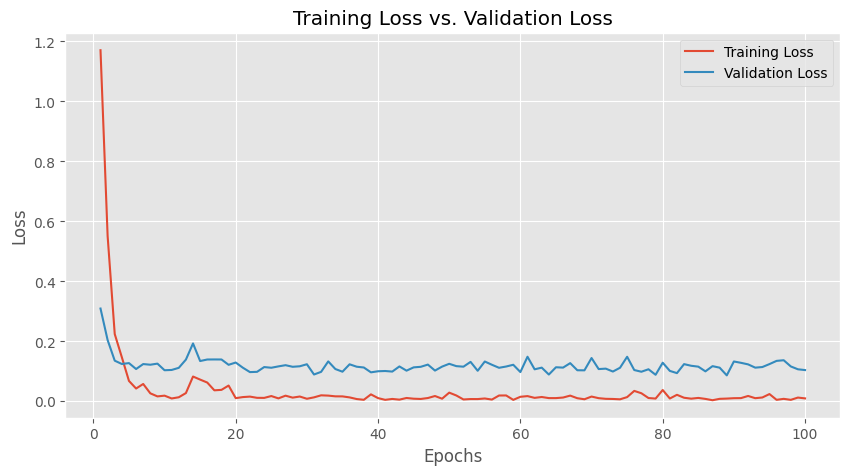

In [12]:
# Plotting the losses
plt.figure(figsize=(10, 5))
plt.plot(range(1, n_epochs + 1), train_losses, label='Training Loss')
plt.plot(range(1, n_epochs + 1), valid_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss vs. Validation Loss')
plt.legend()
plt.show()

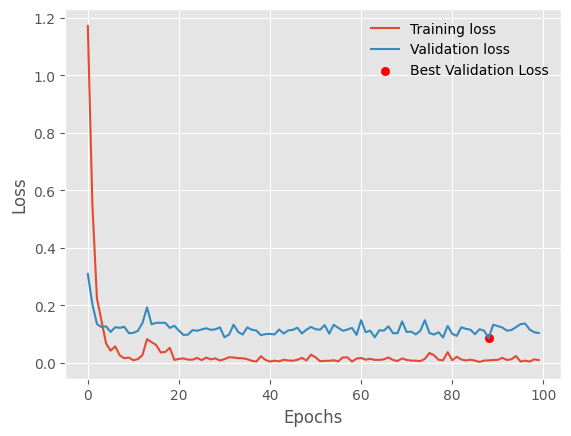

In [13]:
import matplotlib.pyplot as plt

# Assuming 'train_losses' and 'valid_losses' are lists containing training and validation losses for each epoch
# 'best_epoch' is the epoch at which the best validation loss occurred

plt.plot(train_losses, label='Training loss')
plt.plot(valid_losses, label='Validation loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")

# Find the epoch with the minimum validation loss
best_epoch = valid_losses.index(min(valid_losses))

# Plot a marker for the best result
plt.scatter(best_epoch, valid_losses[best_epoch], color='red', label='Best Validation Loss')

plt.legend(frameon=False)
plt.show()


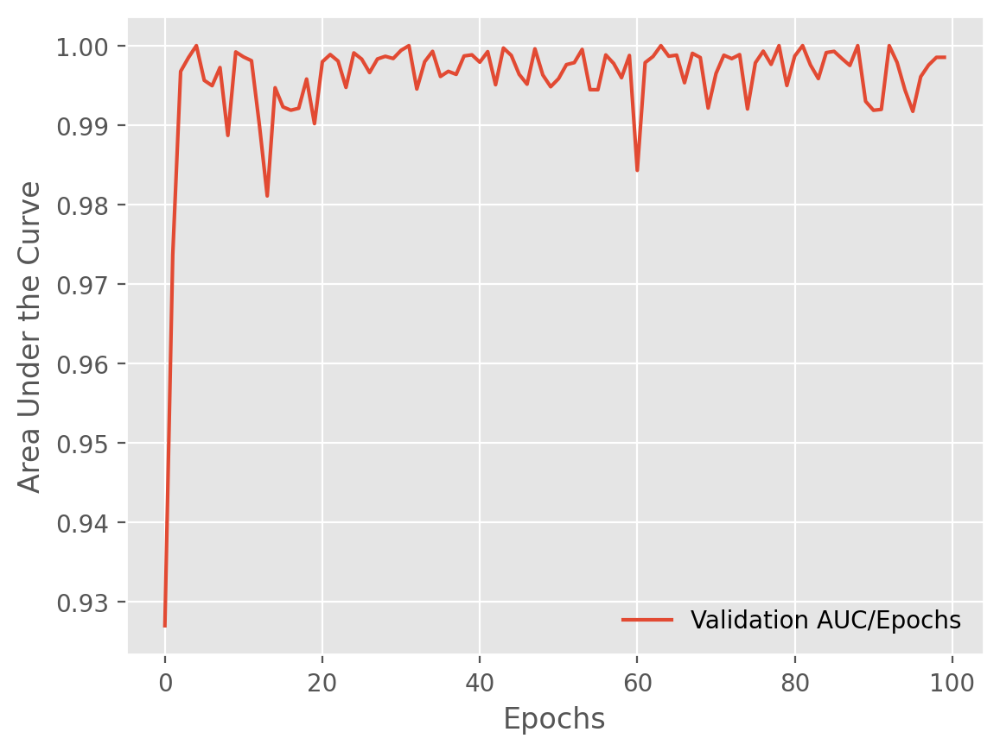

In [14]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.plot(auc_epoch, label='Validation AUC/Epochs')
plt.legend("")
plt.xlabel("Epochs")
plt.ylabel("Area Under the Curve")
plt.legend(frameon=False)

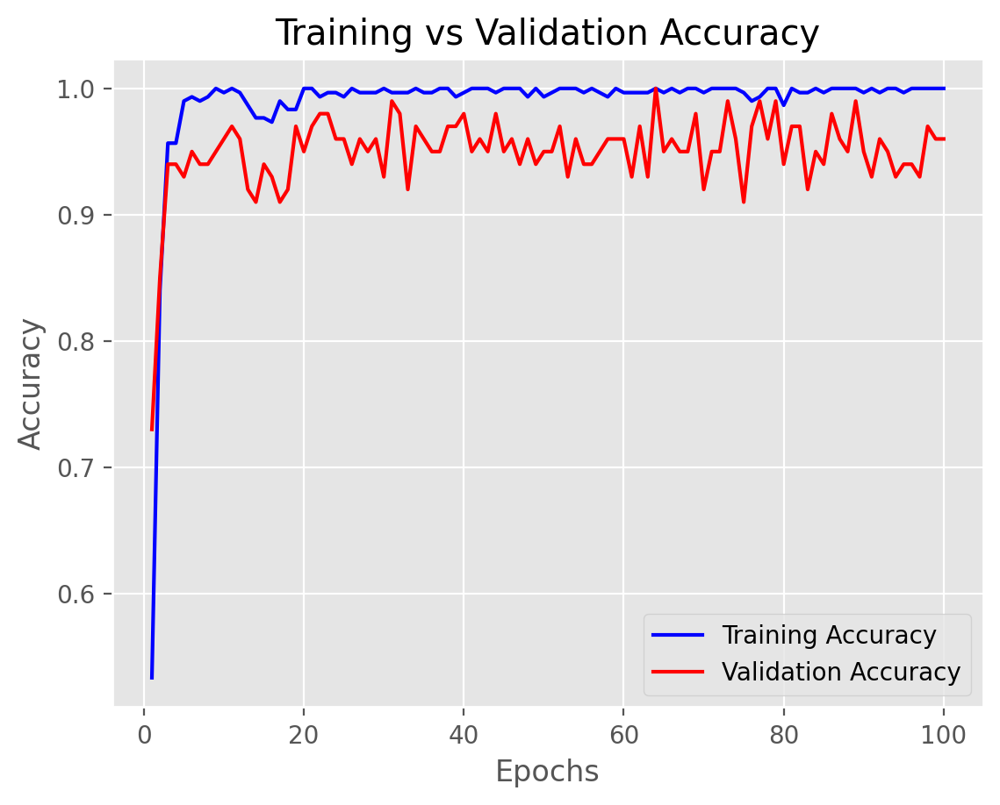

In [15]:
import matplotlib.pyplot as plt

# Number of epochs
epochs = range(1, n_epochs + 1)

# Plotting the data
plt.plot(epochs, train_accuracies, 'b', label='Training Accuracy')
plt.plot(epochs, valid_accuracies, 'r', label='Validation Accuracy')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Display the plot
plt.show()


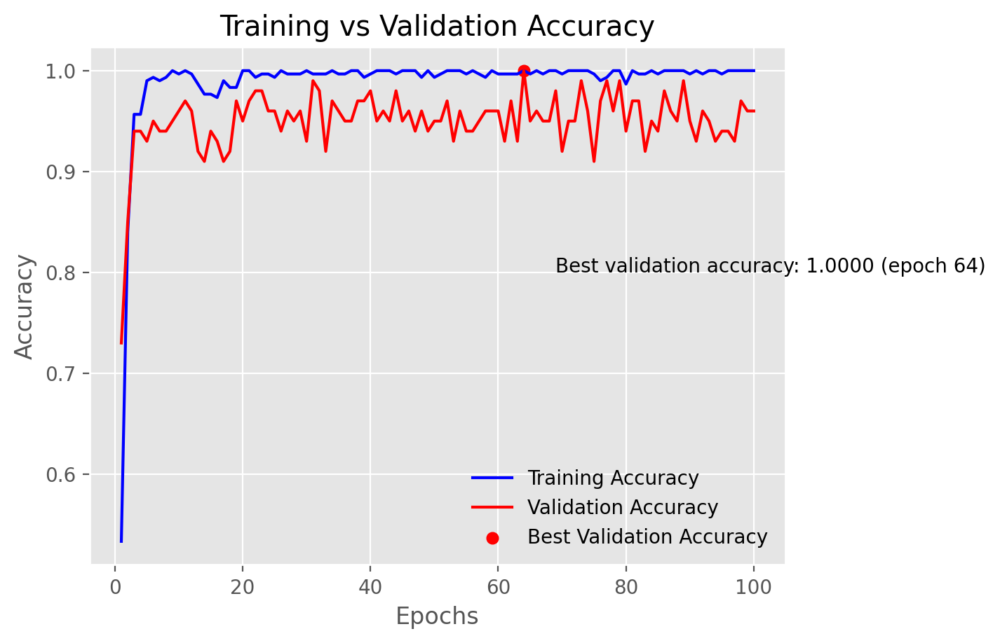

In [16]:
import matplotlib.pyplot as plt

# Number of epochs
epochs = range(1, n_epochs + 1)

# Plotting the data
plt.plot(epochs, train_accuracies, 'b', label='Training Accuracy')
plt.plot(epochs, valid_accuracies, 'r', label='Validation Accuracy')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Find the epoch with the best validation accuracy
best_epoch = valid_accuracies.index(max(valid_accuracies)) + 1
best_accuracy = max(valid_accuracies)

# Annotate the plot with the best validation accuracy
plt.scatter(best_epoch, best_accuracy, color='red', label='Best Validation Accuracy')
plt.annotate(f'Best validation accuracy: {best_accuracy:.4f} (epoch {best_epoch})',
             xy=(best_epoch, best_accuracy),
             xytext=(best_epoch + 5, best_accuracy - 0.2)) # Adjust xytext here

plt.legend(frameon=False)

# Display the plot
plt.show()


In [17]:
best_valid_accuracy_percentage = max(valid_accuracies) * 100
print("Best validation accuracy:", best_valid_accuracy_percentage, "%")


Best validation accuracy: 100.0 %


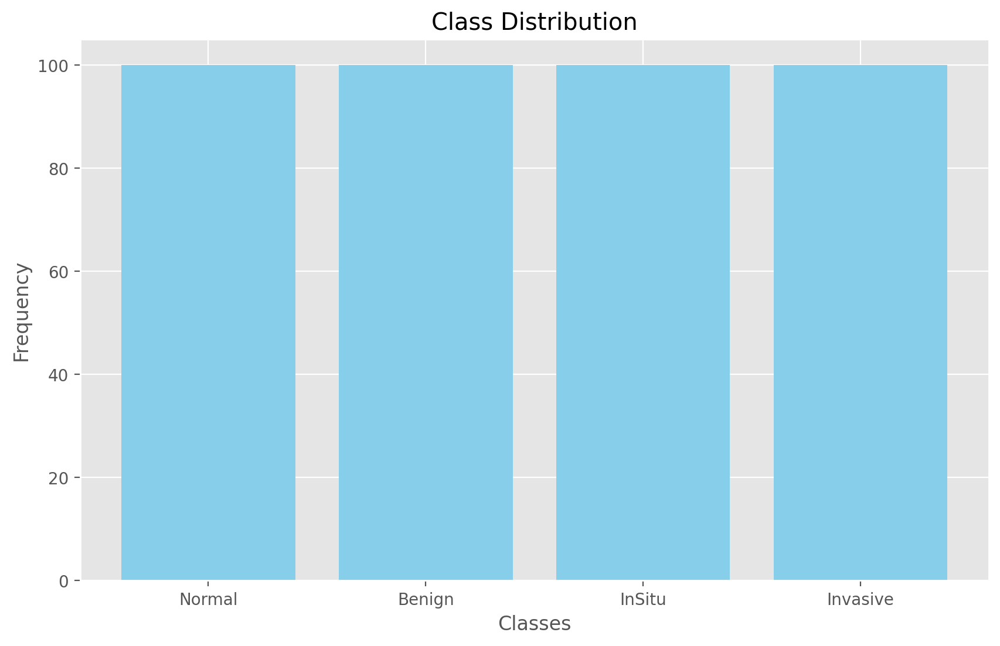

Class: Normal, Count: 100, Percentage: 25.00%
Class: Benign, Count: 100, Percentage: 25.00%
Class: InSitu, Count: 100, Percentage: 25.00%
Class: Invasive, Count: 100, Percentage: 25.00%


In [18]:
import matplotlib.pyplot as plt
from collections import Counter

def check_class_distribution(dataset, class_names):
    # Calculate class frequencies
    class_counts = Counter(dataset.labels)
    
    # Sort classes for a consistent order in plotting
    sorted_class_counts = {class_names[i]: class_counts[i] for i in sorted(class_counts)}
    
    # Plot class distribution
    plt.figure(figsize=(10, 6))
    plt.bar(sorted_class_counts.keys(), sorted_class_counts.values(), color='skyblue')
    plt.xlabel('Classes')
    plt.ylabel('Frequency')
    plt.title('Class Distribution')
    plt.show()
    
    # Display statistics
    total_samples = sum(class_counts.values())
    for class_idx, count in sorted_class_counts.items():
        percentage = (count / total_samples) * 100
        print(f"Class: {class_idx}, Count: {count}, Percentage: {percentage:.2f}%")

# Assuming `dataset` is your dataset object and `dataset.classes` contains the class names
check_class_distribution(dataset, dataset.classes)


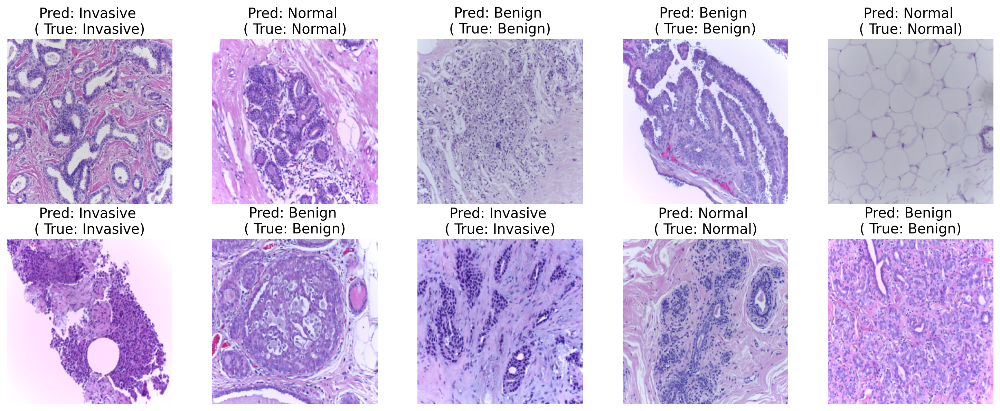

In [19]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Define class names
class_names = ['Normal', 'Benign', 'InSitu', 'Invasive']

# Check if CUDA is available and set train_on_gpu accordingly
train_on_gpu = torch.cuda.is_available()

# Load the best model
model.load_state_dict(torch.load('best_model.pt'))
model.eval()  # Set the model to evaluation mode

# Get a batch of validation data
dataiter = iter(val_loader)
data = next(dataiter)
images, labels = data['image'], data['label']

# Move images to GPU if CUDA is available
if train_on_gpu:
    images = images.cuda()

# Get predictions
output = model(images)
probs = F.softmax(output, dim=1)
_, preds = torch.max(probs, 1)

# Move tensors back to CPU if using GPU
if train_on_gpu:
    images = images.cpu()
    preds = preds.cpu()
    labels = labels.cpu()

# Function to show an image
def imshow(img, ax, title=None):
    img = img / 2 + 0.5  # Unnormalize the image
    npimg = img.numpy()
    ax.imshow(np.transpose(npimg, (1, 2, 0)))
    if title is not None:
        ax.set_title(title)
    ax.axis('off')  # Hide axes

# Plot a few images with predictions and true labels
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))

for idx in range(10):  # Display the first 10 images
    ax = axes[idx // 5, idx % 5]
    imshow(images[idx], ax, title=f'Pred: {class_names[preds[idx].item()]} \n( True: {class_names[labels[idx].item()]})')

plt.tight_layout()
plt.show()


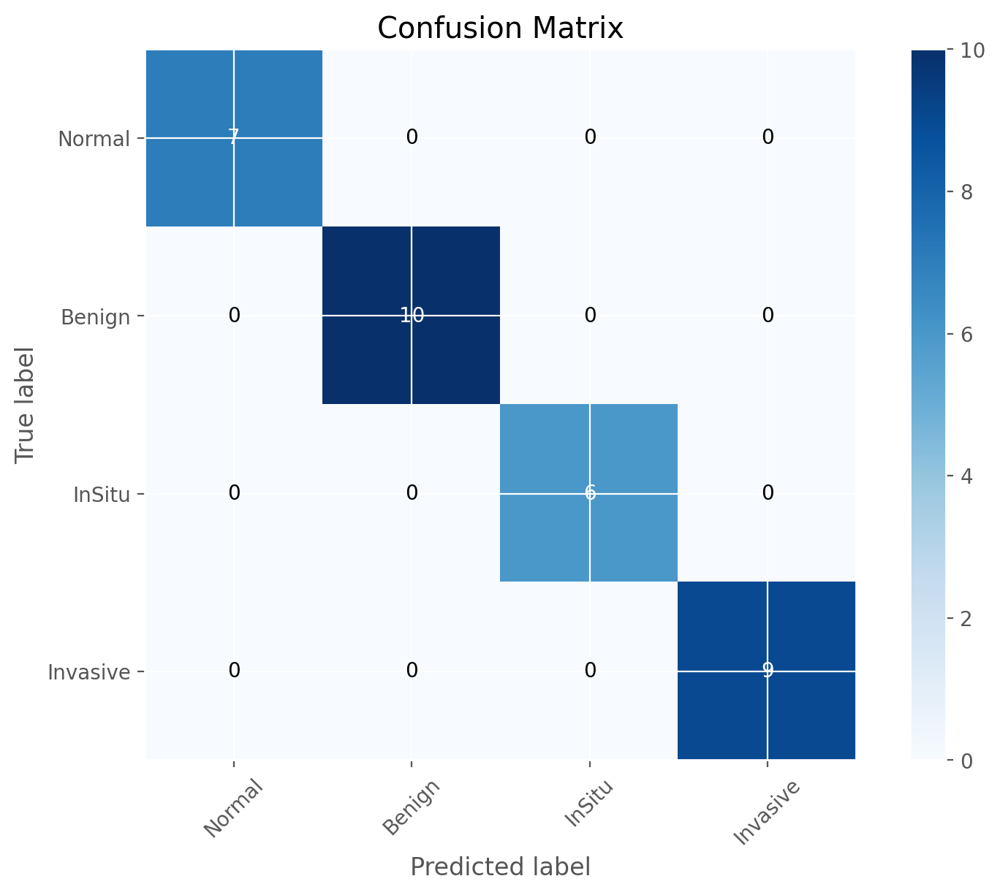

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Compute the confusion matrix
conf_matrix = confusion_matrix(labels, preds)

# Plot the confusion matrix with deeper blue colormap
plt.figure(figsize=(8, 6))
plt.imshow(conf_matrix, interpolation='nearest', cmap='Blues')  # Specify 'Blues' colormap
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

# Print the actual numbers inside the heatmap
thresh = conf_matrix.max() / 2.
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        plt.text(j, i, format(conf_matrix[i, j], 'd'),
                 ha="center", va="center",
                 color="white" if conf_matrix[i, j] > thresh else "black")

plt.tight_layout()
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()


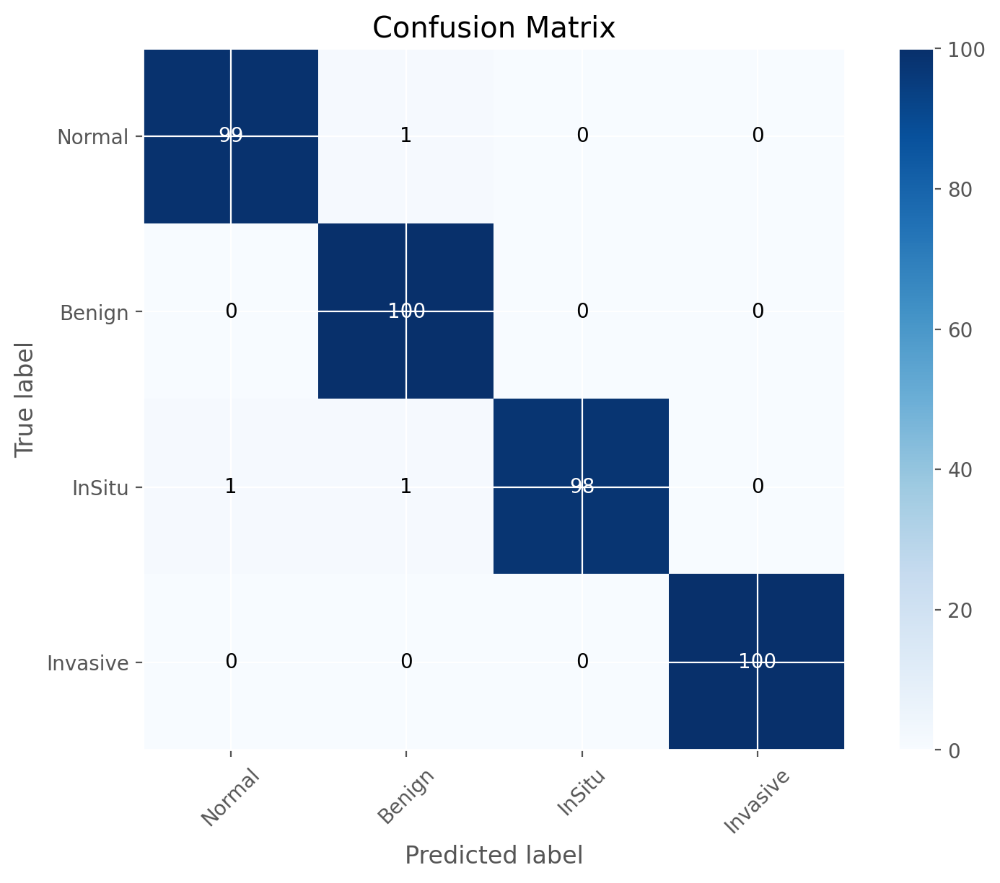

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Initialize empty lists to store all predictions and labels
all_preds = []
all_labels = []

# Set model to evaluation mode
model.eval()

# Iterate over the training dataset
for data in train_loader:
    images, labels = data['image'], data['label']
    
    # Move images and labels to GPU if available
    if train_on_gpu:
        images = images.cuda()
        labels = labels.cuda()
    
    # Get predictions
    with torch.no_grad():
        output = model(images)
        probs = F.softmax(output, dim=1)
        _, preds = torch.max(probs, 1)
    
    # Move tensors to CPU if using GPU
    if train_on_gpu:
        preds = preds.cpu()
        labels = labels.cpu()
    
    # Append current batch predictions and labels to the lists
    all_preds.extend(preds.numpy())
    all_labels.extend(labels.numpy())

# Iterate over the validation dataset
for data in val_loader:
    images, labels = data['image'], data['label']
    
    # Move images and labels to GPU if available
    if train_on_gpu:
        images = images.cuda()
        labels = labels.cuda()
    
    # Get predictions
    with torch.no_grad():
        output = model(images)
        probs = F.softmax(output, dim=1)
        _, preds = torch.max(probs, 1)
    
    # Move tensors to CPU if using GPU
    if train_on_gpu:
        preds = preds.cpu()
        labels = labels.cpu()
    
    # Append current batch predictions and labels to the lists
    all_preds.extend(preds.numpy())
    all_labels.extend(labels.numpy())

# Convert lists to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Compute the confusion matrix for the whole dataset
conf_matrix = confusion_matrix(all_labels, all_preds)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
plt.imshow(conf_matrix, interpolation='nearest', cmap='Blues')
plt.title('Confusion Matrix')
plt.colorbar()

# Add labels to the plot
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

# Add numbers inside the heatmap
thresh = conf_matrix.max() / 2.
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        plt.text(j, i, format(conf_matrix[i, j], 'd'),
                 ha="center", va="center",
                 color="white" if conf_matrix[i, j] > thresh else "black")

# Add axis labels and display the plot
plt.tight_layout()
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()


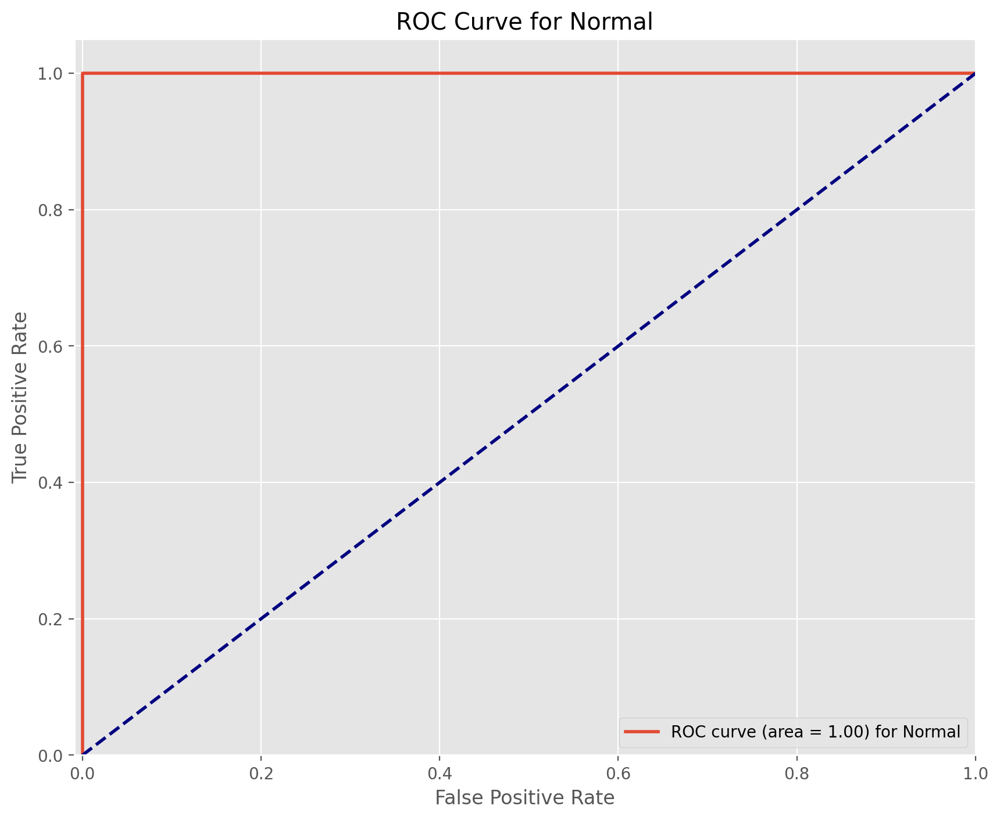

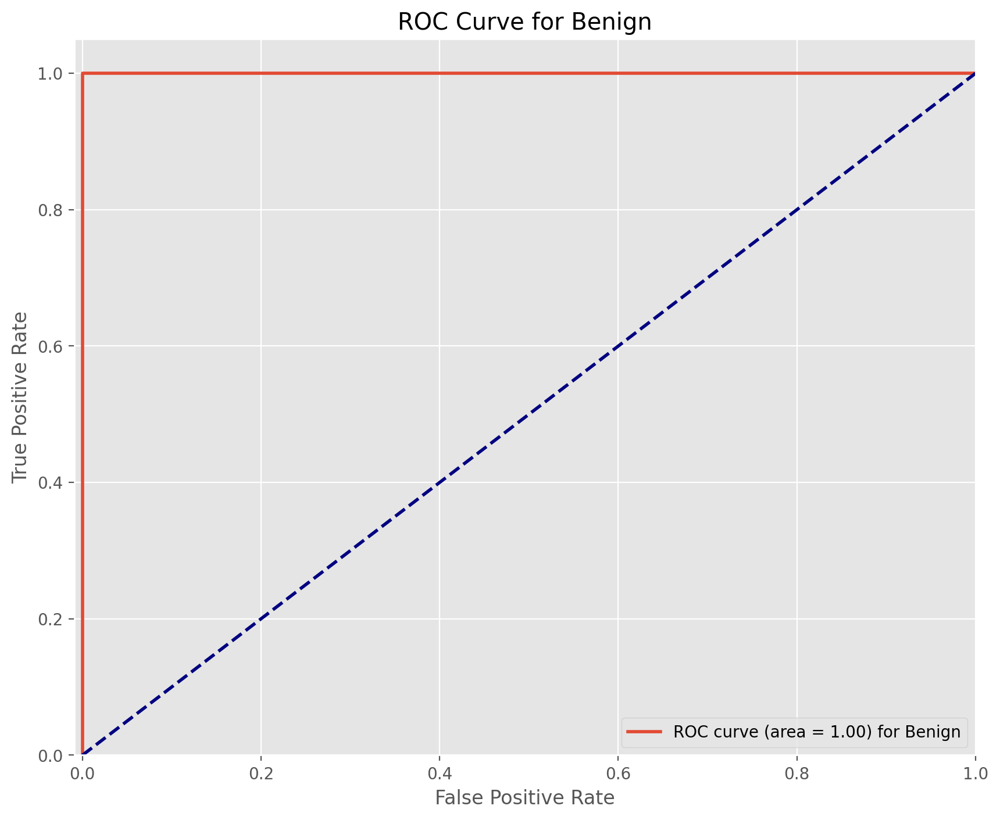

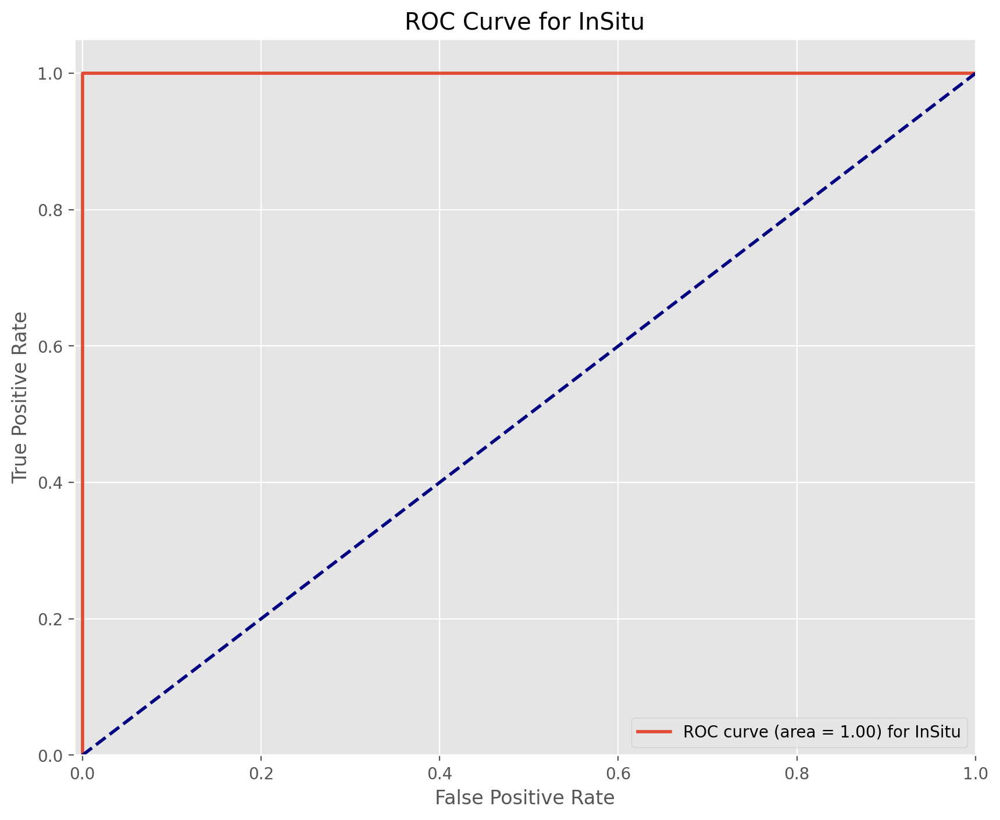

C:\Users\mahed\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


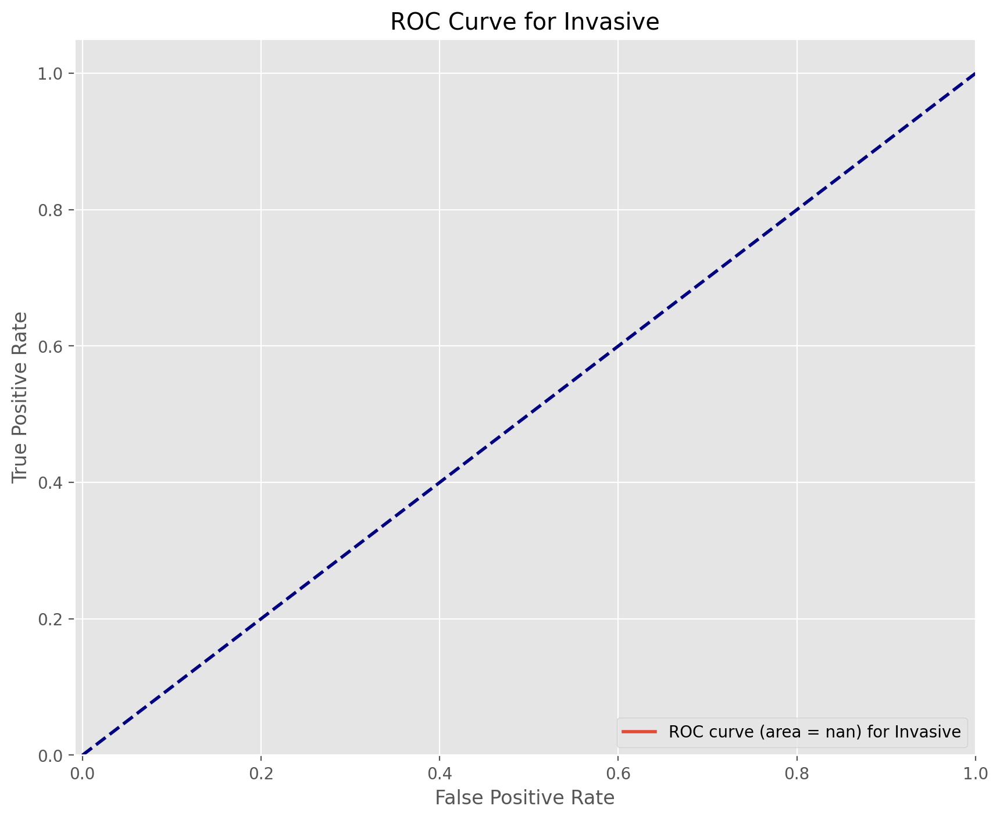

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Assuming preds, labels, and probs are already defined and are the output from the model
# Also assuming class_names is a list of class names

# Convert predictions, labels, and probabilities to CPU and detach from the computation graph
preds_cpu = preds.cpu().detach().numpy()
labels_cpu = labels.cpu().detach().numpy()
probs_cpu = probs.cpu().detach().numpy()

# Convert true labels to one-hot encoding
one_hot_labels = np.eye(len(class_names))[labels_cpu]

# Compute and plot ROC curve for each class
for i in range(len(class_names)):
    plt.figure(figsize=(10, 8))
    
    # Compute ROC curve for the current class
    fpr, tpr, _ = roc_curve(one_hot_labels[:, i], probs_cpu[:, i])
    roc_auc = auc(fpr, tpr)
    
    # Plot ROC curve
    plt.plot(fpr, tpr, lw=2, label=f'ROC curve (area = {roc_auc:.2f}) for {class_names[i]}')
    
    # Plot diagonal reference line
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    
    # Set plot attributes
    plt.xlim([-0.009, 1.00])
    plt.ylim([0.00, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {class_names[i]}')
    plt.legend(loc="lower right")
    
    # Show plot
    plt.show()


C:\Users\mahed\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


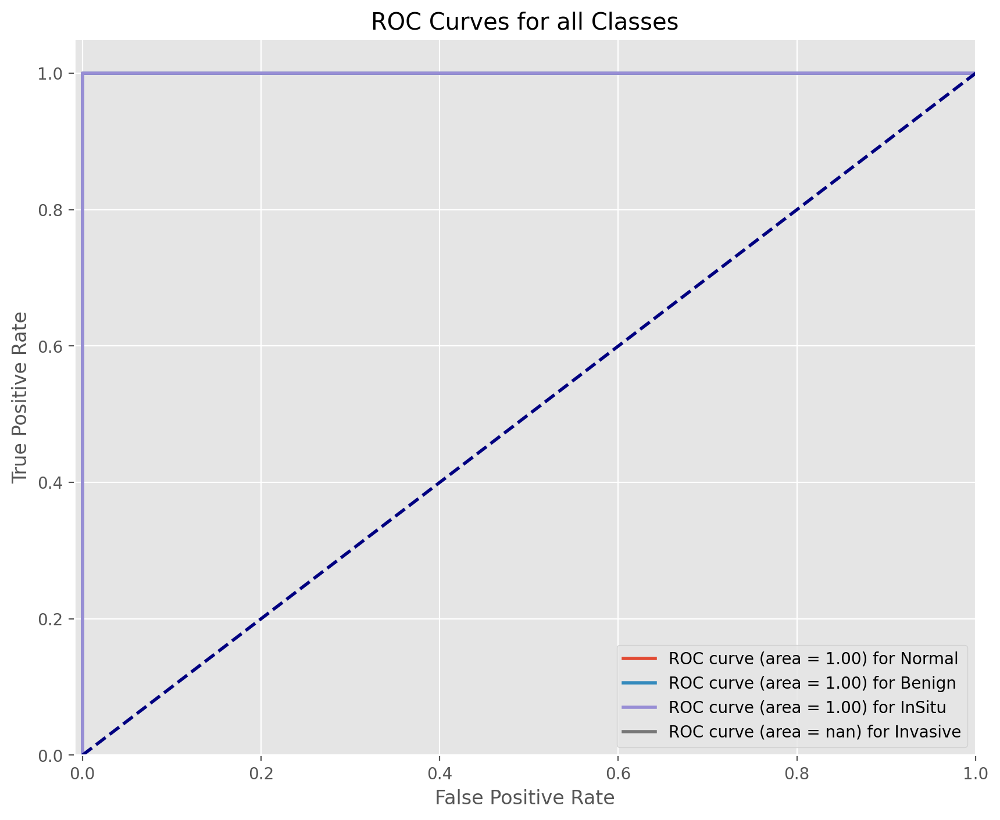

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Convert true labels to one-hot encoding
one_hot_labels = np.eye(len(class_names))[labels]

# Initialize figure
plt.figure(figsize=(10, 8))

# Compute and plot ROC curve for each class
for i in range(len(class_names)):
    # Compute ROC curve for the current class
    fpr, tpr, _ = roc_curve(one_hot_labels[:, i], probs_cpu[:, i])
    roc_auc = auc(fpr, tpr)
    
    # Plot ROC curve for the current class
    plt.plot(fpr, tpr, lw=2, label=f'ROC curve (area = {roc_auc:.2f}) for {class_names[i]}')

# Plot diagonal reference line
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

# Set plot attributes
plt.xlim([-0.009, 1.00])
plt.ylim([0.00, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for all Classes')
plt.legend(loc="lower right")

# Show the combined plot
plt.show()


C:\Users\mahed\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
C:\Users\mahed\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


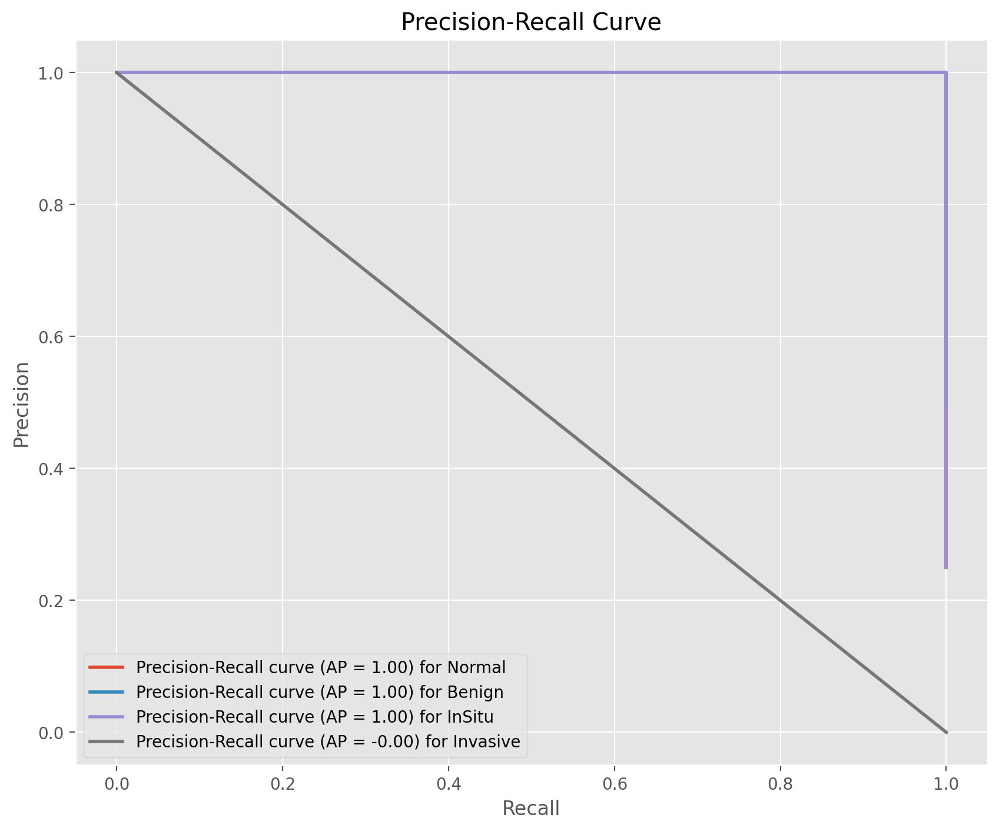

In [24]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score

# Compute and plot Precision-Recall curve for each class
plt.figure(figsize=(10, 8))
for i in range(len(class_names)):
    precision, recall, _ = precision_recall_curve(one_hot_labels[:, i], probs_cpu[:, i])
    avg_precision = average_precision_score(one_hot_labels[:, i], probs_cpu[:, i])
    plt.plot(recall, precision, lw=2, label=f'Precision-Recall curve (AP = {avg_precision:.2f}) for {class_names[i]}')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left")
plt.show()


In [25]:
from sklearn.manifold import TSNE
import torch

# Check if CUDA is available
train_on_gpu = torch.cuda.is_available()

# Extract features from the model
model.eval()
features, labels = [], []

with torch.no_grad():
    for data in val_loader:
        inputs, targets = data['image'], data['label']
        
        # Debugging print statements to check the types
        print(f'Inputs type: {type(inputs)}, Targets type: {type(targets)}')
        
        if train_on_gpu:
            inputs, targets = inputs.cuda(), targets.cuda()
        
        outputs = model(inputs)
        features.append(outputs.cpu().numpy())
        labels.append(targets.cpu().numpy())

features = np.concatenate(features)
labels = np.concatenate(labels)

# Perform TSNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(features)

# Plot TSNE
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    indices = labels == i
    plt.scatter(tsne_results[indices, 0], tsne_results[indices, 1], label=class_name, alpha=0.5)
plt.legend()
plt.title('TSNE Visualization')
plt.show()


Inputs type: <class 'torch.Tensor'>, Targets type: <class 'torch.Tensor'>
Inputs type: <class 'torch.Tensor'>, Targets type: <class 'torch.Tensor'>
